#Setup

In [ ]:
# A few graphs cannot be displayed in the PDF. If you require full access, please contact jd4573@nyu.edu to be added to the share list. 

In [ ]:
!python -m pip install dask[dataframe] --upgrade
!pip install memory_profiler

In [ ]:
import warnings
warnings.filterwarnings('ignore')


In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import dask
import dask.array as da
import dask.dataframe as dd
from dask.diagnostics import ProgressBar 

In [ ]:
# print("Pandas version: ", pd.__version__)
# print("Dask   version: ", dask.__version__)

# Data Loading

In [ ]:
!gdown --id 1g7MhWITLHw1o0akGyCztcJSZxFsVxlMK
!unzip -q '/content/bigdata_dataset.zip'

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1g7MhWITLHw1o0akGyCztcJSZxFsVxlMK
To: /content/bigdata_dataset.zip
100% 44.4M/44.4M [00:00<00:00, 146MB/s]
replace 2020_CA_Region_Mobility_Report.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace 2020_CA_Region_Mobility_Report.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace 2020_CA_Region_Mobility_Report.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


# Data Cleaning


### GDP Dataset

In [ ]:
dd_GDP_world = dd.read_csv("/content/World_GDP.csv")
dd_GDP_world = dd_GDP_world[['LOCATION','TIME','Value']]

In [ ]:
dd_GDP_world.compute()

,LOCATION,TIME,Value
0,KOR,2018-Q1,1.148519
1,KOR,2018-Q2,0.633609
2,KOR,2018-Q3,0.688282
3,KOR,2018-Q4,0.822000
4,KOR,2019-Q1,-0.199688
...,...,...,...
859,CRI,2020-Q4,4.412640
860,CRI,2021-Q1,1.869415
861,CRI,2021-Q2,1.896151
862,CRI,2021-Q3,3.776817


In [ ]:
mask = (dd_GDP_world['LOCATION'].str.len() == 3) & (dd_GDP_world['LOCATION'] != 'G-7')
dd_GDP_world_sort = dd_GDP_world.loc[(mask) & (~dd_GDP_world["TIME"].isin(["2018-Q1","2018-Q2","2018-Q3","2018-Q4","2019-Q1","2019-Q2","2019-Q3","2019-Q4","2022-Q1"]))]
dd_GDP_world_sort = dd_GDP_world_sort.reset_index()
dd_GDP_world_sort = dd_GDP_world_sort.drop(['index'],axis = 1)
dd_GDP_world_sort = dd_GDP_world_sort.rename(columns={"LOCATION": "Code", "TIME":"Time","Value":"Quarterly GDP Growth Rate"})
dd_GDP_world_sort['Time'] = dd_GDP_world_sort['Time'].replace('-', '', regex=True)

In [ ]:
dd_GDP_world_sort.compute()

,Code,Time,Quarterly GDP Growth Rate
0,KOR,2020Q1,-1.261507
1,KOR,2020Q2,-3.150738
2,KOR,2020Q3,2.233424
3,KOR,2020Q4,1.142221
4,KOR,2021Q1,1.740407
...,...,...,...
378,CRI,2020Q4,4.412640
379,CRI,2021Q1,1.869415
380,CRI,2021Q2,1.896151
381,CRI,2021Q3,3.776817


In [ ]:
dd_GDP_rank = dd_GDP_world_sort.groupby(by = 'Code').mean().compute().sort_values(by = 'Quarterly GDP Growth Rate',ascending = False)

In [ ]:
dd_five = dd_GDP_world.loc[(dd_GDP_world["LOCATION"].isin(["JPN", "USA", "GBR", "TUR", "CAN"])) & (~dd_GDP_world["TIME"].isin(["2018-Q1","2018-Q2","2018-Q3","2018-Q4","2022-Q1"]))]
dd_five = dd_five.reset_index()
dd_five = dd_five.drop(['index'],axis = 1)
dd_five = dd_five.rename(columns={"LOCATION": "Code"})
dd_five['TIME'] = dd_five['TIME'].replace('-', '', regex=True)

### Policy Dataset

In [ ]:
dd_fc = dd.read_csv("/content/face-covering-policies-covid.csv",parse_dates=['Day'])
dd_is = dd.read_csv("/content/income-support-covid.csv",parse_dates=['Day'])
dd_pt = dd.read_csv("/content/public-transport-covid.csv",parse_dates=['Day'])
dd_sc = dd.read_csv("/content/school-closures-covid.csv",parse_dates=['Day'])
dd_vp = dd.read_csv("/content/covid-vaccination-policy.csv",parse_dates=['Day']) 
dd_sah = dd.read_csv("/content/stay-at-home-covid.csv",parse_dates=['Day'])

In [ ]:
dd_fc['Day'] = dd.to_datetime(dd_fc['Day'])
dd_is['Day'] = dd.to_datetime(dd_is['Day'])
dd_pt['Day'] = dd.to_datetime(dd_pt['Day'])
dd_sc['Day'] = dd.to_datetime(dd_sc['Day'])
dd_vp['Day'] = dd.to_datetime(dd_vp['Day'])
dd_sah['Day'] = dd.to_datetime(dd_sah['Day'])

In [ ]:
dd_fc.compute().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154352 entries, 0 to 154351
Data columns (total 4 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Entity            154352 non-null  object        
 1   Code              154352 non-null  object        
 2   Day               154352 non-null  datetime64[ns]
 3   facial_coverings  154352 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 4.7+ MB


In [ ]:
def convertQ(dd_name):
  dd_name['Time'] = dd_name['Day'].dt.to_period('Q').astype('string')
  return dd_name.groupby(['Code','Time']).mean().reset_index()
  

In [ ]:
def combine(dd_fc_Q,dd_is_Q,dd_pt_Q,dd_sc_Q,dd_vp_Q,dd_GDP_world_sort):
  dd_combine = dd_fc_Q.merge(dd_is_Q, how ='left').merge(dd_pt_Q, how = 'left').merge(dd_sc_Q, how = 'left').merge(dd_vp_Q, how = 'left').merge(dd_GDP_world_sort,how ='left')
  dd_combine = dd_combine.dropna().reset_index()
  dd_combine = dd_combine.loc[dd_combine['Code'] != 'RUS']
  dd_combine = dd_combine.drop(['index'],axis = 1)
  return dd_combine

In [ ]:
dd_fc_Q = convertQ(dd_fc)
dd_is_Q = convertQ(dd_is)
dd_pt_Q = convertQ(dd_pt)
dd_sc_Q = convertQ(dd_sc)
dd_vp_Q = convertQ(dd_vp)
dd_combine = combine(dd_fc_Q,dd_is_Q,dd_pt_Q,dd_sc_Q,dd_vp_Q,dd_GDP_world_sort)

In [ ]:
dd_combine.compute()

,Code,Time,facial_coverings,income_support,close_public_transport,school_closures,vaccination_policy,Quarterly GDP Growth Rate
0,ARG,2020Q1,0.000000,0.098901,0.197802,0.676056,0.000000,-4.089572
1,ARG,2020Q2,2.571429,1.000000,2.000000,3.000000,0.000000,-14.913956
2,ARG,2020Q3,3.000000,1.000000,2.000000,3.000000,0.000000,11.875660
3,ARG,2020Q4,3.000000,1.000000,2.000000,3.000000,0.032609,4.455026
4,ARG,2021Q1,3.000000,1.000000,2.000000,2.466667,1.422222,3.216986
...,...,...,...,...,...,...,...,...
378,ZAF,2020Q4,3.000000,1.000000,0.489130,0.597826,0.000000,2.548717
379,ZAF,2021Q1,3.077778,1.000000,1.000000,1.400000,0.655556,1.040859
380,ZAF,2021Q2,3.000000,0.835165,0.912088,1.307692,1.857143,1.317869
381,ZAF,2021Q3,3.000000,0.858696,1.000000,1.271739,4.108696,-1.727377


In [ ]:
us_fc = dd_fc.loc[dd_fc['Code'] == "USA"]
us_pt = dd_pt.loc[dd_pt['Code'] == "USA"]
us_sc = dd_sc.loc[dd_sc['Code'] == "USA"]
us_sah = dd_sah.loc[dd_sah['Code'] == "USA"]

tr_fc = dd_fc.loc[dd_fc['Code'] == "TUR"]
tr_pt = dd_pt.loc[dd_pt['Code'] == "TUR"]
tr_sc = dd_sc.loc[dd_sc['Code'] == "TUR"]
tr_sah = dd_sah.loc[dd_sah['Code'] == "TUR"]

jp_fc = dd_fc.loc[dd_fc['Code'] == "JPN"]
jp_pt = dd_pt.loc[dd_pt['Code'] == "JPN"]
jp_sc = dd_sc.loc[dd_sc['Code'] == "JPN"]
jp_sah = dd_sah.loc[dd_sah['Code'] == "JPN"]

In [ ]:
df_stringency = dd.read_csv("/content/owid-covid-data.csv", sample=25000000)
df_stringency['date'] = dd.to_datetime(df_stringency['date'], infer_datetime_format=True)

In [ ]:

df_stringency_us = df_stringency.loc[df_stringency['location'] == "United States"].compute()
df_stringency_us = df_stringency_us.fillna(0)
df_stringency_us = df_stringency_us[['date', 'stringency_index']]
df_stringency_us.rename(columns={'stringency_index': 'us_stringency_index'}, inplace=True)

df_stringency_gb = df_stringency.loc[df_stringency['location'] == "United Kingdom"].compute()
df_stringency_gb = df_stringency_gb.fillna(0)
df_stringency_gb = df_stringency_gb[['date', 'stringency_index']]
df_stringency_gb.rename(columns={'stringency_index': 'gb_stringency_index'}, inplace=True)

df_stringency_jp = df_stringency.loc[df_stringency['location'] == "Japan"].compute()
df_stringency_jp = df_stringency_jp.fillna(0)
df_stringency_jp = df_stringency_jp[['date', 'stringency_index']]
df_stringency_jp.rename(columns={'stringency_index': 'jp_stringency_index'}, inplace=True)

df_stringency_ca = df_stringency.loc[df_stringency['location'] == "Canada"].compute()
df_stringency_ca = df_stringency_ca.fillna(0)
df_stringency_ca = df_stringency_ca[['date', 'stringency_index']]
df_stringency_ca.rename(columns={'stringency_index': 'ca_stringency_index'}, inplace=True)

df_stringency_tr = df_stringency.loc[df_stringency['location'] == "Turkey"].compute()
df_stringency_tr = df_stringency_tr.fillna(0)
df_stringency_tr = df_stringency_tr[['date', 'stringency_index']]
df_stringency_tr.rename(columns={'stringency_index': 'tr_stringency_index'}, inplace=True)

### Mobility Dataset

In [ ]:
df_us_mobility_2020 = dd.read_csv("/content/2020_US_Region_Mobility_Report.csv", sample=25000000)
df_us_mobility_2021 = dd.read_csv("/content/2021_US_Region_Mobility_Report.csv", sample=25000000)
df_us_mobility_2022 = dd.read_csv("/content/2022_US_Region_Mobility_Report.csv", sample=25000000)

df_us_mobility = dd.concat([df_us_mobility_2020, df_us_mobility_2021])
df_us_mobility = dd.concat([df_us_mobility, df_us_mobility_2022])

df_us_mobility['date'] = dd.to_datetime(df_us_mobility['date'], infer_datetime_format=True)
df_us_mobility = df_us_mobility.loc[df_us_mobility['sub_region_1'].isnull()].compute()
df_us_mobility = df_us_mobility.drop(columns=['sub_region_1', 'sub_region_2', 'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id'])

us_transit = df_us_mobility[['date', 'transit_stations_percent_change_from_baseline']]
us_park = df_us_mobility[['date', 'parks_percent_change_from_baseline']]
us_residential = df_us_mobility[['date', 'residential_percent_change_from_baseline']]


df_us_case = dd.read_csv(["/content/United_States_COVID-19_Cases_and_Deaths_by_State_over_Time.csv"], sample=25000000)
df_us_vaccine = dd.read_csv(["/content/COVID-19_Vaccinations_in_the_United_States_Jurisdiction.csv"], sample=25000000)


In [ ]:
def convertPolicy(dd_name):
  dd_name['Time'] = dd_name['Day'].dt.to_period('Q').astype('string')
  return dd_name.groupby(['Time']).mean().reset_index()

In [ ]:
def convertMobility(dd_name):
  dd_name['Time'] = dd_name['date'].dt.to_period('Q').astype('string')
  return dd_name.groupby(['Time']).mean().reset_index()

In [ ]:
us_fc_convert = convertPolicy(us_fc)
us_pt_convert = convertPolicy(us_pt)
us_sc_convert = convertPolicy(us_sc)
us_sah_convert = convertPolicy(us_sah)
us_transit_convert = convertMobility(us_transit)
us_park_convert = convertMobility(us_park)
us_residential_convert = convertMobility(us_residential)

In [ ]:
def combine_policy_with_mobility(fc_convert,pt_convert,sc_convert,sah_convert,transit_convert,park_convert,residential_convert):
  dd_combine = fc_convert.merge(pt_convert, how ='left').merge(sc_convert, how = 'left')\
      .merge(sah_convert, how = 'left').merge(transit_convert, how = 'left').merge(park_convert,how ='left')\
      .merge(residential_convert, how = 'left')
  dd_combine = dd_combine.dropna().reset_index()
  dd_combine = dd_combine.drop(['index'],axis = 1)
  return dd_combine

In [ ]:

def combine_mobility_with_GDP(stringency_convert,transit_convert,park_convert,residential_convert,workplace_convert,grocery_convert,country_GDP):
  dd_combine = stringency_convert.merge(transit_convert, how ='left').merge(park_convert, how ='left').merge(residential_convert, how = 'left')\
      .merge(workplace_convert, how = 'left').merge(grocery_convert, how = 'left').merge(country_GDP,how ='left')
  dd_combine = dd_combine.dropna().reset_index()
  dd_combine = dd_combine.drop(['index'],axis = 1)
  return dd_combine

In [ ]:
df_tr_mobility_2020 = dd.read_csv("/content/2020_TR_Region_Mobility_Report.csv", sample=25000000)
df_tr_mobility_2021 = dd.read_csv("/content/2021_TR_Region_Mobility_Report.csv", sample=25000000)
df_tr_mobility_2022 = dd.read_csv("/content/2022_TR_Region_Mobility_Report.csv", sample=25000000)

df_tr_mobility = dd.concat([df_tr_mobility_2020, df_tr_mobility_2021])
df_tr_mobility = dd.concat([df_tr_mobility, df_tr_mobility_2022])

df_tr_mobility['date'] = dd.to_datetime(df_tr_mobility['date'], infer_datetime_format=True)
df_tr_mobility = df_tr_mobility.loc[df_tr_mobility['sub_region_1'].isnull()].compute()
df_tr_mobility = df_tr_mobility.drop(columns=['sub_region_1', 'sub_region_2', 'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id'])

tr_transit = df_tr_mobility[['date', 'transit_stations_percent_change_from_baseline']]
tr_park = df_tr_mobility[['date', 'parks_percent_change_from_baseline']]
tr_residential = df_tr_mobility[['date', 'residential_percent_change_from_baseline']]
tr_workplace = df_tr_mobility[['date', 'workplaces_percent_change_from_baseline']]
tr_grocery = df_tr_mobility[['date', 'grocery_and_pharmacy_percent_change_from_baseline']]

tr_GDP = dd_GDP_world_sort.loc[dd_GDP_world_sort['Code'] == "TUR"]
tr_GDP = tr_GDP.drop(columns=['Code'])

tr_stringency_data = df_stringency.loc[df_stringency['location'] == "Turkey"]
tr_stringency_data = tr_stringency_data.fillna(0)
tr_stringency_data = tr_stringency_data[['date', 'stringency_index']]

In [ ]:
tr_fc_convert = convertPolicy(tr_fc)
tr_pt_convert = convertPolicy(tr_pt)
tr_sc_convert = convertPolicy(tr_sc)
tr_sah_convert = convertPolicy(tr_sah)
tr_transit_convert = convertMobility(tr_transit)
tr_park_convert = convertMobility(tr_park)
tr_residential_convert = convertMobility(tr_residential)
tr_workplace_convert = convertMobility(tr_workplace)
tr_grocery_convert = convertMobility(tr_grocery)
tr_stringency_convert = convertMobility(tr_stringency_data)

In [ ]:
df_jp_mobility_2020 = dd.read_csv("/content/2020_JP_Region_Mobility_Report.csv", sample=25000000)
df_jp_mobility_2021 = dd.read_csv("/content/2021_JP_Region_Mobility_Report.csv", sample=25000000)
df_jp_mobility_2022 = dd.read_csv("/content/2022_JP_Region_Mobility_Report.csv", sample=25000000)

df_jp_mobility = dd.concat([df_jp_mobility_2020, df_jp_mobility_2021])
df_jp_mobility = dd.concat([df_jp_mobility, df_jp_mobility_2022])

df_jp_mobility['date'] = dd.to_datetime(df_jp_mobility['date'], infer_datetime_format=True)
df_jp_mobility = df_jp_mobility.loc[df_jp_mobility['sub_region_1'].isnull()].compute()
df_jp_mobility = df_jp_mobility.drop(columns=['sub_region_1', 'sub_region_2', 'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id'])

jp_transit = df_jp_mobility[['date', 'transit_stations_percent_change_from_baseline']]
jp_park = df_jp_mobility[['date', 'parks_percent_change_from_baseline']]
jp_residential = df_jp_mobility[['date', 'residential_percent_change_from_baseline']]
jp_workplace = df_jp_mobility[['date', 'workplaces_percent_change_from_baseline']]
jp_grocery = df_jp_mobility[['date', 'grocery_and_pharmacy_percent_change_from_baseline']]

jp_GDP = dd_GDP_world_sort.loc[dd_GDP_world_sort['Code'] == "JPN"]
jp_GDP = jp_GDP.drop(columns=['Code'])


jp_stringency_data = df_stringency.loc[df_stringency['location'] == "Japan"]
jp_stringency_data = jp_stringency_data.fillna(0)
jp_stringency_data = jp_stringency_data[['date', 'stringency_index']]

In [ ]:
jp_fc_convert = convertPolicy(jp_fc)
jp_pt_convert = convertPolicy(jp_pt)
jp_sc_convert = convertPolicy(jp_sc)
jp_sah_convert = convertPolicy(jp_sah)
jp_transit_convert = convertMobility(jp_transit)
jp_park_convert = convertMobility(jp_park)
jp_residential_convert = convertMobility(jp_residential)
jp_workplace_convert = convertMobility(jp_workplace)
jp_grocery_convert = convertMobility(jp_grocery)
jp_stringency_convert = convertMobility(jp_stringency_data)

In [ ]:
df_gb_mobility_2020 = dd.read_csv("/content/2020_GB_Region_Mobility_Report.csv", sample=25000000)
df_gb_mobility_2021 = dd.read_csv("/content/2021_GB_Region_Mobility_Report.csv", sample=25000000)
df_gb_mobility_2022 = dd.read_csv("/content/2022_GB_Region_Mobility_Report.csv", sample=25000000)

df_gb_mobility = dd.concat([df_gb_mobility_2020, df_gb_mobility_2021])
df_gb_mobility = dd.concat([df_gb_mobility, df_gb_mobility_2022])

df_gb_mobility['date'] = dd.to_datetime(df_gb_mobility['date'], infer_datetime_format=True)
df_gb_mobility = df_gb_mobility.loc[df_gb_mobility['sub_region_1'].isnull()].compute()
df_gb_mobility = df_gb_mobility.drop(columns=['sub_region_1', 'sub_region_2', 'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id'])


In [ ]:
df_ca_mobility_2020 = dd.read_csv("/content/2020_CA_Region_Mobility_Report.csv", sample=25000000)
df_ca_mobility_2021 = dd.read_csv("/content/2021_CA_Region_Mobility_Report.csv", sample=25000000)
df_ca_mobility_2022 = dd.read_csv("/content/2022_CA_Region_Mobility_Report.csv", sample=25000000)

df_ca_mobility = dd.concat([df_ca_mobility_2020, df_ca_mobility_2021])
df_ca_mobility = dd.concat([df_ca_mobility, df_ca_mobility_2022])

df_ca_mobility['date'] = dd.to_datetime(df_ca_mobility['date'], infer_datetime_format=True)
df_ca_mobility = df_ca_mobility.loc[df_ca_mobility['sub_region_1'].isnull()].compute()
df_ca_mobility = df_ca_mobility.drop(columns=['sub_region_1', 'sub_region_2', 'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id'])
df_ca_mobility.head(1000)

,country_region_code,country_region,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,CA,Canada,2020-02-15,4.0,2.0,10.0,3.0,1.0,0.0
1,CA,Canada,2020-02-16,13.0,8.0,41.0,4.0,0.0,-2.0
2,CA,Canada,2020-02-17,-12.0,-15.0,63.0,-28.0,-52.0,11.0
3,CA,Canada,2020-02-18,-1.0,4.0,6.0,-1.0,-1.0,1.0
4,CA,Canada,2020-02-19,1.0,1.0,9.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
111,CA,Canada,2022-04-22,-5.0,1.0,35.0,-40.0,-21.0,7.0
112,CA,Canada,2022-04-23,2.0,4.0,47.0,-30.0,0.0,2.0
113,CA,Canada,2022-04-24,6.0,3.0,86.0,-29.0,-3.0,1.0
114,CA,Canada,2022-04-25,-5.0,2.0,27.0,-42.0,-22.0,7.0


In [ ]:
dd_develop = df_stringency[['iso_code','human_development_index']]
dd_combine_country = dd_combine[['Code']].drop_duplicates().reset_index()
dd_combine_country = dd_combine_country.drop(['index'],axis = 1)
country_list = []
for _,i in dd_combine_country.iterrows():
     country_list.append(i.item())
dd_develop = dd_develop.loc[dd_develop['iso_code'].isin(country_list)].dropna()
dd_develop = dd_develop.drop_duplicates().reset_index()
dd_develop = dd_develop.drop(['index'],axis = 1)

dd_temp = dd_develop.set_index('human_development_index')
dd_develop_sort = dd_temp.map_partitions(lambda df: df.sort_values(['human_development_index'], ascending=False)).reset_index()

# Data Visualization

In [ ]:
# basic visualization package
import matplotlib.pyplot as plt
import matplotlib.cm as cm
# advanced ploting
import seaborn as sns

# interactive visualization
import plotly.express as px
import plotly.graph_objects as go
# import plotly.figure_factory as ff
from plotly.subplots import make_subplots



In [ ]:
def plot_map(df, policy):
    fig = px.choropleth(df, locations=df.Entity,
                  color=policy,
                  range_color=[0,4],
                  locationmode='country names',
                  animation_frame=df["Day"].dt.strftime('%Y-%m-%d'),
                  title='Change Over Time', color_continuous_scale=px.colors.sequential.Teal
                  )
    fig.update_layout(coloraxis_showscale=True)
    fig.show()

## GDP

In [ ]:
px.histogram(dd_combine, x=dd_combine['Code'], y=dd_combine['Quarterly GDP Growth Rate']/8,color=dd_combine['Code'], text_auto=True).update_layout(
    title={"text": '2020-2021 GDP Growth Rate Rank'}, yaxis_title="AVG of GDP Growth Rate", xaxis_title="Country"
).update_xaxes(categoryorder="total descending")

In [ ]:
fig_gdp = px.line(dd_combine, x= dd_combine.Time, y= dd_combine['Quarterly GDP Growth Rate'], 
                  color= dd_combine.Code,
                  labels={'x':'Time(Quarterly)','y':'% change'},
                  title = '2020-2021 Quarterly GDP', markers=True)
fig_gdp.show()

## Policies Change Over Time

### 1. Facial Covering Policy

In [ ]:
plot_map(dd_fc, dd_fc.facial_coverings)

The color range from dark to light indicates the severity of the policy.
Light blue as none to dark blue as the most severe.

We can see that China is the first country in the world to start the facial covering policy. From the end of 2019 to 2021, China's mask policy has always been the highest.

As Covid-19 is spreading around the world, many other countries are also started the facial covering policy.

### 2. Income Support Policy

In [ ]:
plot_map(dd_is,dd_is.income_support)

In terms of income support, we can see that some countries are doing very well, such as the United States, Canada, and most countries in Europe which have helped people a lot in the first place. Of course, this also promotes their economic to a certain extent.

### 3. Public Transport Policy

In [ ]:
plot_map(dd_pt, dd_pt.close_public_transport)

### 4. School and Workplace Closures Policy

In [ ]:
plot_map(dd_sc, dd_sc.school_closures)

### 5. Vaccination Policy

In [ ]:
plot_map(dd_vp, dd_vp.vaccination_policy)

### 6. Stringency Index

Text(0.5, 0, 'date')

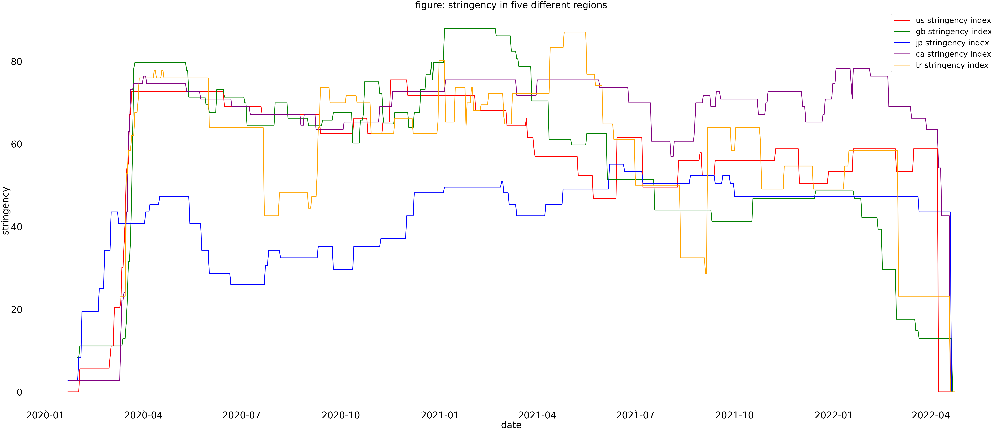

In [ ]:
plt.figure(figsize=(250,450))
plt.rc('xtick', labelsize=60)
plt.rc('ytick', labelsize=60)
plt.subplot(823)
plt.plot(df_stringency_us['date'], df_stringency_us['us_stringency_index'], color='red', label='us stringency index', linewidth=5)
plt.plot(df_stringency_gb['date'], df_stringency_gb['gb_stringency_index'], color='green', label='gb stringency index', linewidth=5)
plt.plot(df_stringency_jp['date'], df_stringency_jp['jp_stringency_index'], color='blue', label='jp stringency index', linewidth=5)
plt.plot(df_stringency_ca['date'], df_stringency_ca['ca_stringency_index'], color='purple', label='ca stringency index', linewidth=5)
plt.plot(df_stringency_tr['date'], df_stringency_tr['tr_stringency_index'], color='orange', label='tr stringency index', linewidth=5)
plt.legend(prop={'size': 50})
plt.title('figure: stringency in five different regions', fontsize=60)
plt.ylabel('stringency', fontsize=60)
plt.xlabel('date', fontsize=60)

## Correlation of Policies to GDP


In [ ]:
policy_corrMatrix = dd_combine.corr()
policy_corrMatrix.compute()

,facial_coverings,income_support,close_public_transport,school_closures,vaccination_policy,Quarterly GDP Growth Rate
facial_coverings,1.000000,0.182133,0.328882,0.415951,0.330302,0.252419
income_support,0.182133,1.000000,-0.029609,0.157894,0.091541,0.056180
close_public_transport,0.328882,-0.029609,1.000000,0.428539,0.055371,-0.030723
school_closures,0.415951,0.157894,0.428539,1.000000,-0.161641,-0.142244
vaccination_policy,0.330302,0.091541,0.055371,-0.161641,1.000000,0.137702
Quarterly GDP Growth Rate,0.252419,0.056180,-0.030723,-0.142244,0.137702,1.000000


In [ ]:
from numpy.core.fromnumeric import size
def heat_map(df,title):
    
    df_Matrix = df.corr()
    plt.figure(figsize=(10,10))
    plt.matshow(df_Matrix,fignum =1)
    plt.xticks(ticks = range(df_Matrix.shape[1]), labels = df_Matrix.columns, fontsize = 12, rotation = 45, ha = "left")
    plt.yticks(ticks = range(df_Matrix.shape[1]), labels = df_Matrix.columns, fontsize = 12)
    plt.title(f'{title}',y=1.3,x=-0.3,loc='Left',fontweight="bold",size=20)
    plt.clim(-1,1)

    cb = plt.colorbar()
    cb.ax.tick_params(labelsize=10)

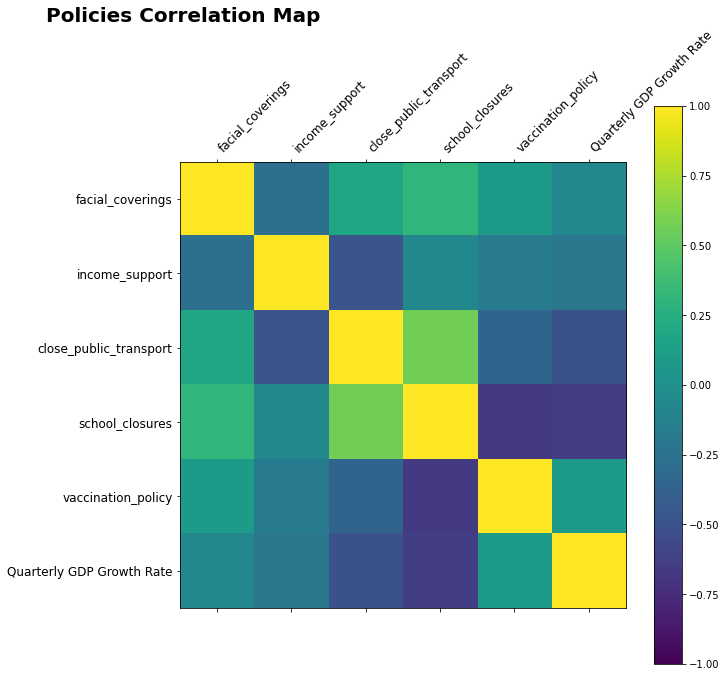

In [ ]:
heat_map(policy_corrMatrix, 'Policies Correlation Map')

GDP is positively affected by the face-covering policy and the covid vaccination policy. The former has a 0.250567 impact and the latter has a 0.13877 impact.

### Policy Rank

In [ ]:
px.histogram(dd_combine, x=dd_combine['Code'], y=dd_combine['facial_coverings']/8,title='2020-2021 Facial Coverings Policy Rank',color=dd_combine['Code'], text_auto=True)\
.update_layout(yaxis_title="AVG of Facial Coverings Policy", xaxis_title="Country")\
.update_xaxes(categoryorder="total descending")

In [ ]:
px.histogram(dd_combine, x=dd_combine['Code'], y=dd_combine['income_support']/8,title='2020-2021 Income Support Policy Rank',color=dd_combine['Code'], text_auto=True)\
.update_layout(yaxis_title="AVG of Income Support Policy", xaxis_title="Country")\
.update_xaxes(categoryorder="total descending")

In [ ]:
px.histogram(dd_combine, x=dd_combine['Code'], y=dd_combine['school_closures']/8,title='2020-2021 School Closures Policy Rank',color=dd_combine['Code'], text_auto=True)\
.update_layout(yaxis_title="AVG of School Closures Policy", xaxis_title="Country")\
.update_xaxes(categoryorder="total descending")

In [ ]:
px.histogram(dd_combine, x=dd_combine['Code'], y=dd_combine['close_public_transport']/8,title='2020-2021 Close Public Transport Policy Rank',color=dd_combine['Code'], text_auto=True)\
.update_layout(yaxis_title="AVG of Close Public Transport Policy", xaxis_title="Country")\
.update_xaxes(categoryorder="total descending")

In [ ]:
px.histogram(dd_develop_sort, x=dd_develop_sort['iso_code'], y=dd_develop_sort['human_development_index'], text_auto=True).update_layout(
    title={"text": 'human_development_index Rank'}, yaxis_title="human_development_index", xaxis_title="Country")

In [ ]:
px.histogram(dd_combine, x=dd_combine['Code'], y=dd_combine['vaccination_policy']/8,title='2020-2021 Vaccination Policy Rank',color=dd_combine['Code'], text_auto=True)\
.update_layout(yaxis_title="AVG of Vaccination Policy", xaxis_title="Country")\
.update_xaxes(categoryorder="total descending")

### Country Analysis

In [ ]:
def country_policy_scatter(dd_combine,name):
  dd_target = dd_combine.loc[dd_combine['Code'].isin([name])]
  fig = go.Figure()

  # Add traces
  fig.add_trace(go.Scatter(x=dd_target['Time'], y=dd_target['facial_coverings'],mode='lines+markers',name='facial_coverings'))
  fig.add_trace(go.Scatter(x=dd_target['Time'], y=dd_target['income_support'],mode='lines+markers',name='income_support'))
  fig.add_trace(go.Scatter(x=dd_target['Time'], y=dd_target['close_public_transport'],mode='lines+markers',name='close_public_transport'))
  fig.add_trace(go.Scatter(x=dd_target['Time'], y=dd_target['school_closures'],mode='lines+markers',name='school_closures'))
  fig.add_trace(go.Scatter(x=dd_target['Time'], y=dd_target['vaccination_policy'],mode='lines+markers',name='vaccination_policy'))

  fig.update_layout(
    title=f'{name} 2020-2021 Policy Rank',
    xaxis_title="Time",
    yaxis_title="Policy level"
)
  fig.show()


In [ ]:
country_policy_scatter(dd_combine,'CAN')

In [ ]:
country_policy_scatter(dd_combine,'JPN')

In [ ]:
country_policy_scatter(dd_combine,'USA')

In [ ]:
country_policy_scatter(dd_combine,'TUR')

## Policies Impacts to Mobility

### 1. Policy Impacts to Mobility



In [ ]:
df_us_case = df_us_case.compute()
df_us_case['submission_date_str'] = df_us_case['submission_date']
df_us_case['submission_date'] = dd.to_datetime(df_us_case['submission_date'], infer_datetime_format=True)
df_us_case = df_us_case.sort_values(by='submission_date')
df_us_case.head(100)
fig = px.choropleth(df_us_case,
                    locations='state',
                    locationmode="USA-states",
                    color='tot_cases',
                    color_continuous_scale="Viridis_r",
                    scope="usa",
                    animation_frame='submission_date_str') #make sure 'period_begin' is string type and sorted in ascending order
fig.show()

In [ ]:
df_us_vaccine = df_us_vaccine.compute()
df_us_vaccine['DateStr'] = df_us_vaccine['Date']
df_us_vaccine['Date'] = dd.to_datetime(df_us_vaccine['Date'], infer_datetime_format=True)
df_us_vaccine = df_us_vaccine.sort_values(by='Date')

fig = px.choropleth(df_us_vaccine,
                    locations='Location', 
                    locationmode="USA-states", 
                    color='Dist_Per_100K',
                    color_continuous_scale="Viridis_r", 
                    scope="usa",
                    animation_frame='DateStr') #make sure 'period_begin' is string type and sorted in ascending order

fig.show()

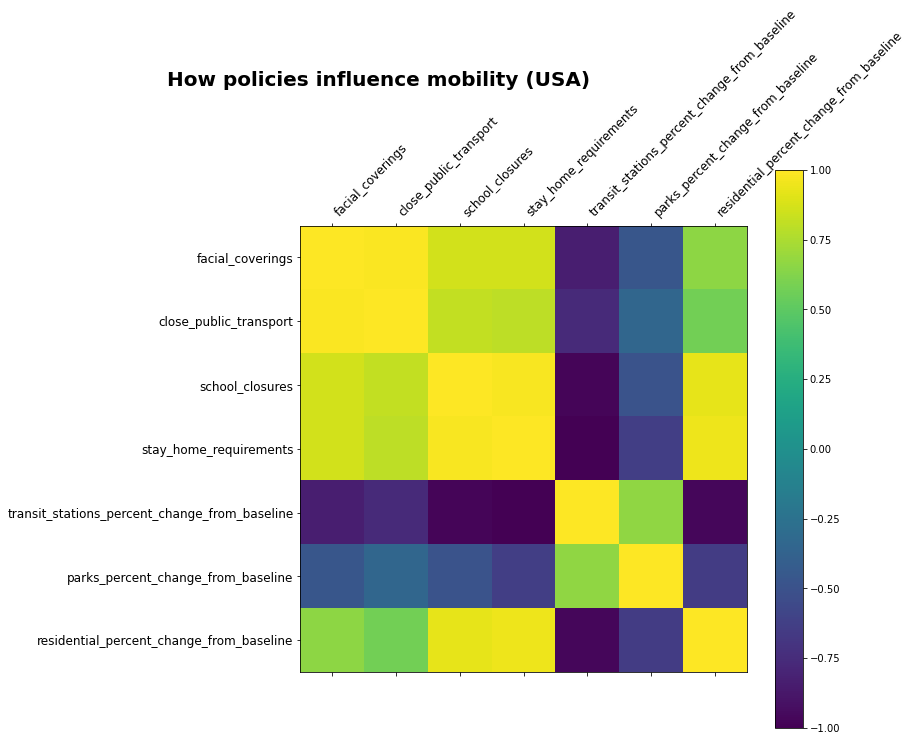

In [ ]:
combine_US_df = combine_policy_with_mobility(us_fc_convert,us_pt_convert,us_sc_convert,us_sah_convert,us_transit_convert,us_park_convert,us_residential_convert)
policy_corrMatrix_US = combine_US_df.corr()
heat_map(policy_corrMatrix_US, 'How policies influence mobility (USA)')

In [ ]:
combine_TR_df = combine_policy_with_mobility(tr_fc_convert,tr_pt_convert,tr_sc_convert,tr_sah_convert,tr_transit_convert,tr_park_convert,tr_residential_convert)
policy_corrMatrix_TR = combine_TR_df.corr()
policy_corrMatrix_TR.compute()

,facial_coverings,close_public_transport,school_closures,stay_home_requirements,transit_stations_percent_change_from_baseline,parks_percent_change_from_baseline,residential_percent_change_from_baseline
facial_coverings,1.000000,0.570022,0.061221,0.098612,0.266954,0.285890,-0.314448
close_public_transport,0.570022,1.000000,-0.191578,-0.045500,0.201351,-0.128432,0.132637
school_closures,0.061221,-0.191578,1.000000,0.902259,-0.773361,-0.242487,0.561045
stay_home_requirements,0.098612,-0.045500,0.902259,1.000000,-0.872607,-0.419963,0.646110
transit_stations_percent_change_from_baseline,0.266954,0.201351,-0.773361,-0.872607,1.000000,0.734920,-0.854219
parks_percent_change_from_baseline,0.285890,-0.128432,-0.242487,-0.419963,0.734920,1.000000,-0.861975
residential_percent_change_from_baseline,-0.314448,0.132637,0.561045,0.646110,-0.854219,-0.861975,1.000000


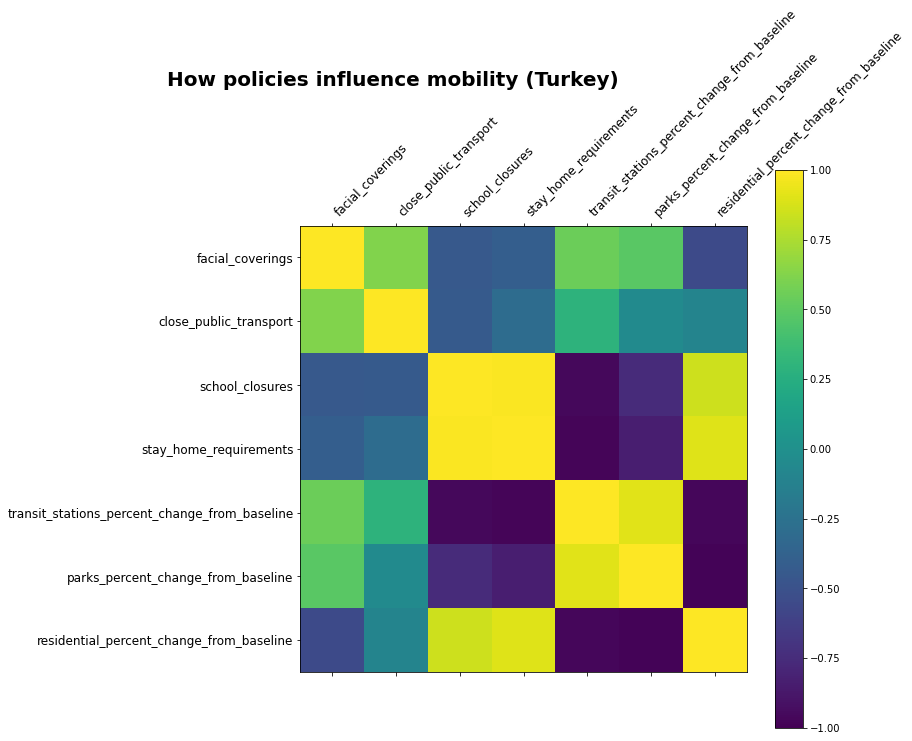

In [ ]:
heat_map(policy_corrMatrix_TR,'How policies influence mobility (Turkey)')

In [ ]:
combine_JP_df = combine_policy_with_mobility(jp_fc_convert,jp_pt_convert,jp_sc_convert,jp_sah_convert,jp_transit_convert,jp_park_convert,jp_residential_convert)
policy_corrMatrix_JP = combine_JP_df.corr()
policy_corrMatrix_JP.compute()

,facial_coverings,close_public_transport,school_closures,stay_home_requirements,transit_stations_percent_change_from_baseline,parks_percent_change_from_baseline,residential_percent_change_from_baseline
facial_coverings,1.000000,0.211227,-0.085827,0.876412,-0.372120,-0.477824,0.389551
close_public_transport,0.211227,1.000000,-0.240949,0.248470,-0.211092,-0.475103,0.049246
school_closures,-0.085827,-0.240949,1.000000,-0.437628,-0.672302,0.230306,0.716400
stay_home_requirements,0.876412,0.248470,-0.437628,1.000000,-0.105036,-0.657895,0.100117
transit_stations_percent_change_from_baseline,-0.372120,-0.211092,-0.672302,-0.105036,1.000000,0.406230,-0.974913
parks_percent_change_from_baseline,-0.477824,-0.475103,0.230306,-0.657895,0.406230,1.000000,-0.356409
residential_percent_change_from_baseline,0.389551,0.049246,0.716400,0.100117,-0.974913,-0.356409,1.000000


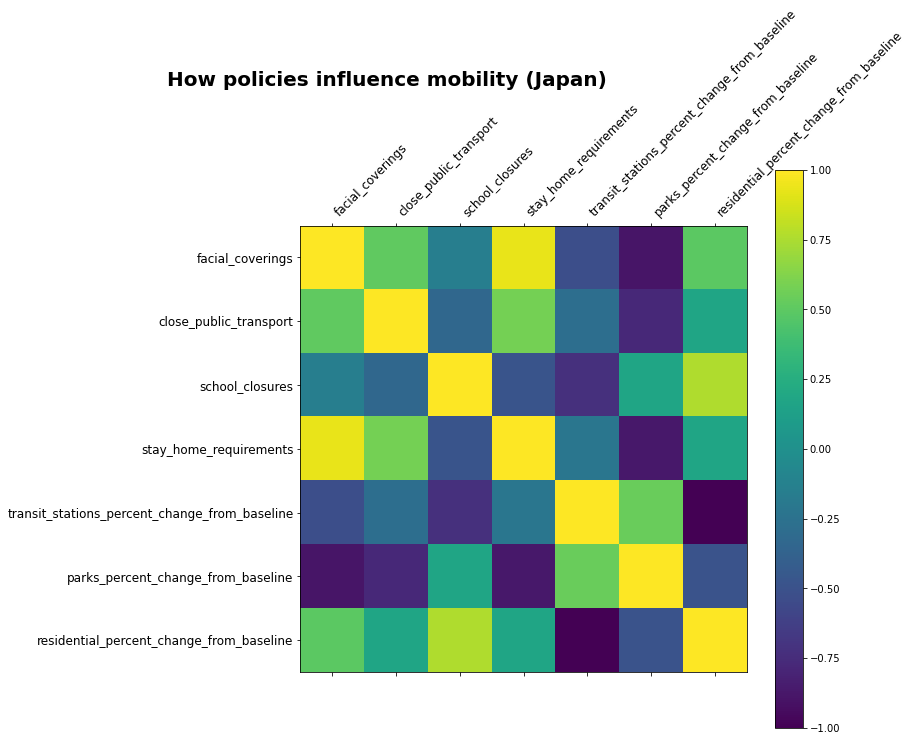

In [ ]:
heat_map(policy_corrMatrix_JP,'How policies influence mobility (Japan)')

### 2. Parks Mobility

Text(0.5, 0, 'date')

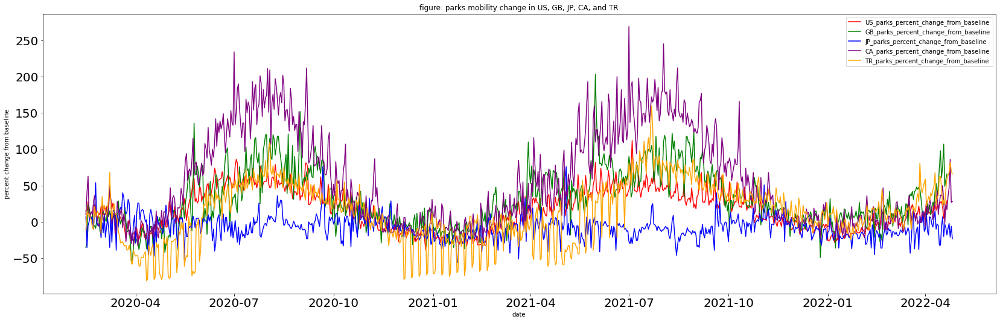

In [ ]:
plt.figure(figsize=(300, 70))
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.subplot(797)
plt.plot(df_us_mobility['date'], df_us_mobility['parks_percent_change_from_baseline'], color="red", label='US_parks_percent_change_from_baseline')
plt.plot(df_gb_mobility['date'], df_gb_mobility['parks_percent_change_from_baseline'], color="green", label='GB_parks_percent_change_from_baseline')
plt.plot(df_jp_mobility['date'], df_jp_mobility['parks_percent_change_from_baseline'], color="blue", label='JP_parks_percent_change_from_baseline')
plt.plot(df_ca_mobility['date'], df_ca_mobility['parks_percent_change_from_baseline'], color="purple", label='CA_parks_percent_change_from_baseline')
plt.plot(df_tr_mobility['date'], df_tr_mobility['parks_percent_change_from_baseline'], color="orange", label='TR_parks_percent_change_from_baseline')

plt.legend()
plt.title('figure: parks mobility change in US, GB, JP, CA, and TR')
plt.ylabel('percent change from baseline')
plt.xlabel('date')

### 3. Residential Mobility

Text(0.5, 0, 'date')

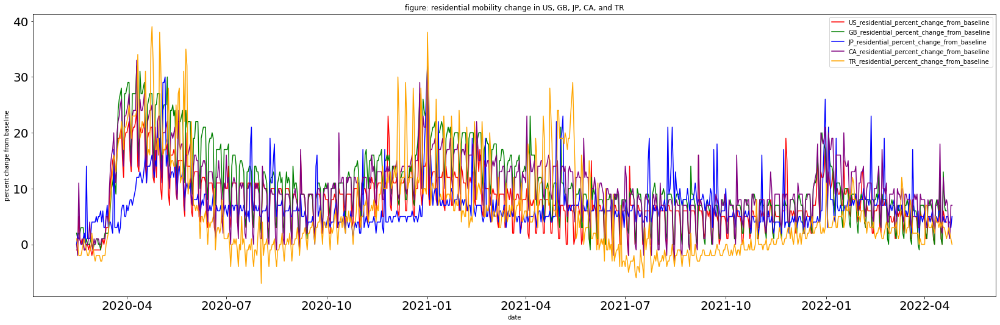

In [ ]:
plt.figure(figsize=(300, 70))
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.subplot(797)
plt.plot(df_us_mobility['date'], df_us_mobility['residential_percent_change_from_baseline'], color="red", label='US_residential_percent_change_from_baseline')
plt.plot(df_gb_mobility['date'], df_gb_mobility['residential_percent_change_from_baseline'], color="green", label='GB_residential_percent_change_from_baseline')
plt.plot(df_jp_mobility['date'], df_jp_mobility['residential_percent_change_from_baseline'], color="blue", label='JP_residential_percent_change_from_baseline')
plt.plot(df_ca_mobility['date'], df_ca_mobility['residential_percent_change_from_baseline'], color="purple", label='CA_residential_percent_change_from_baseline')
plt.plot(df_tr_mobility['date'], df_tr_mobility['residential_percent_change_from_baseline'], color="orange", label='TR_residential_percent_change_from_baseline')

plt.legend()
plt.title('figure: residential mobility change in US, GB, JP, CA, and TR')
plt.ylabel('percent change from baseline')
plt.xlabel('date')

### 4. Workplaces Mobility

Text(0.5, 0, 'date')

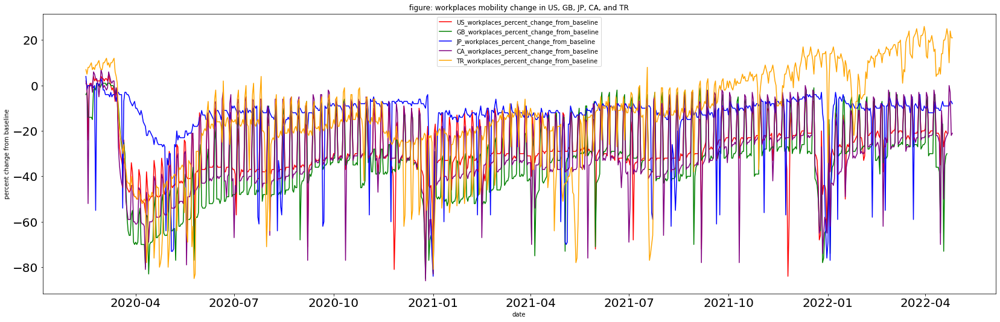

In [ ]:
plt.figure(figsize=(300, 70))
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.subplot(797)
plt.plot(df_us_mobility['date'], df_us_mobility['workplaces_percent_change_from_baseline'], color="red", label='US_workplaces_percent_change_from_baseline')
plt.plot(df_gb_mobility['date'], df_gb_mobility['workplaces_percent_change_from_baseline'], color="green", label='GB_workplaces_percent_change_from_baseline')
plt.plot(df_jp_mobility['date'], df_jp_mobility['workplaces_percent_change_from_baseline'], color="blue", label='JP_workplaces_percent_change_from_baseline')
plt.plot(df_ca_mobility['date'], df_ca_mobility['workplaces_percent_change_from_baseline'], color="purple", label='CA_workplaces_percent_change_from_baseline')
plt.plot(df_tr_mobility['date'], df_tr_mobility['workplaces_percent_change_from_baseline'], color="orange", label='TR_workplaces_percent_change_from_baseline')

plt.legend()
plt.title('figure: workplaces mobility change in US, GB, JP, CA, and TR')
plt.ylabel('percent change from baseline')
plt.xlabel('date')

### 5. Grocery Mobility

Text(0.5, 0, 'date')

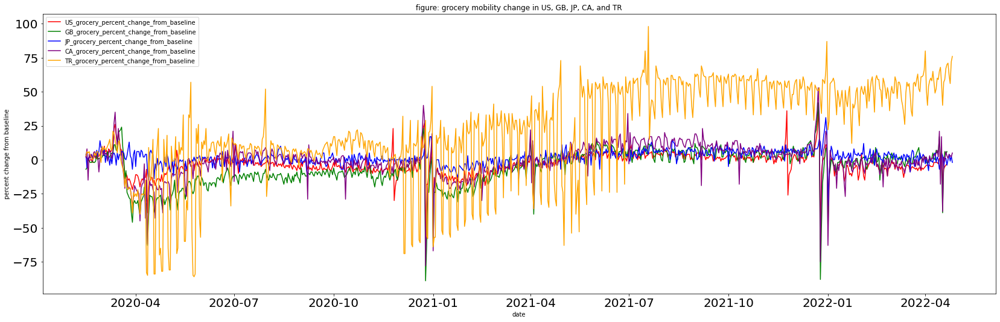

In [ ]:
plt.figure(figsize=(300, 70))
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.subplot(797)
plt.plot(df_us_mobility['date'], df_us_mobility['grocery_and_pharmacy_percent_change_from_baseline'], color="red", label='US_grocery_percent_change_from_baseline')
plt.plot(df_gb_mobility['date'], df_gb_mobility['grocery_and_pharmacy_percent_change_from_baseline'], color="green", label='GB_grocery_percent_change_from_baseline')
plt.plot(df_jp_mobility['date'], df_jp_mobility['grocery_and_pharmacy_percent_change_from_baseline'], color="blue", label='JP_grocery_percent_change_from_baseline')
plt.plot(df_ca_mobility['date'], df_ca_mobility['grocery_and_pharmacy_percent_change_from_baseline'], color="purple", label='CA_grocery_percent_change_from_baseline')
plt.plot(df_tr_mobility['date'], df_tr_mobility['grocery_and_pharmacy_percent_change_from_baseline'], color="orange", label='TR_grocery_percent_change_from_baseline')

plt.legend()
plt.title('figure: grocery mobility change in US, GB, JP, CA, and TR')
plt.ylabel('percent change from baseline')
plt.xlabel('date')

## Mobility to GDP

### 1. GDP in five countries



In [ ]:
fig_gdp = px.line(dd_five, x= dd_five.TIME, y= dd_five.Value, 
                  color= dd_five.Code,
                  labels={'x':'Time(Quarterly)','y':'% change'},
                  title = '2019-2021 Quarterly GDP', markers=True)
fig_gdp.show()

### 2. Mobility to GDP in Turkey

In [ ]:
def country_mobility_scatter(dd_trans, dd_park, dd_resid, dd_workplace, dd_grocery, name):
  fig = go.Figure()

  # Add traces
  fig.add_trace(go.Scatter(x=dd_trans['Time'], y=dd_trans['transit_stations_percent_change_from_baseline'],mode='lines+markers',name='transit_stations_percent_change_from_baseline'))
  fig.add_trace(go.Scatter(x=dd_park['Time'], y=dd_park['parks_percent_change_from_baseline'],mode='lines+markers',name='parks_percent_change_from_baseline'))
  fig.add_trace(go.Scatter(x=dd_resid['Time'], y=dd_resid['residential_percent_change_from_baseline'],mode='lines+markers',name='residential_percent_change_from_baseline'))
  fig.add_trace(go.Scatter(x=dd_workplace['Time'], y=dd_workplace['workplaces_percent_change_from_baseline'],mode='lines+markers',name='workplaces_percent_change_from_baseline'))

  fig.update_layout(
    title=f'{name} 2020-2022 Mobility change',
    xaxis_title="Time",
    yaxis_title="Mobility change"
)
  fig.show()

In [ ]:
country_mobility_scatter(tr_transit_convert, tr_park_convert, tr_residential_convert, tr_workplace_convert, tr_grocery_convert,'Turkey')

In [ ]:
combine_tr_mobility_gdp = combine_mobility_with_GDP(tr_stringency_convert,tr_transit_convert,tr_park_convert,tr_residential_convert,tr_workplace_convert,tr_grocery_convert,tr_GDP);
corrMatrix_TR_GDP = combine_tr_mobility_gdp.corr()
corrMatrix_TR_GDP.compute()

,stringency_index,transit_stations_percent_change_from_baseline,parks_percent_change_from_baseline,residential_percent_change_from_baseline,workplaces_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,Quarterly GDP Growth Rate
stringency_index,1.000000,-0.799876,-0.775071,0.888529,-0.762960,-0.568602,-0.434208
transit_stations_percent_change_from_baseline,-0.799876,1.000000,0.758519,-0.908267,0.860580,0.935902,0.403217
parks_percent_change_from_baseline,-0.775071,0.758519,1.000000,-0.881647,0.460667,0.660931,0.615187
residential_percent_change_from_baseline,0.888529,-0.908267,-0.881647,1.000000,-0.797226,-0.746038,-0.685645
workplaces_percent_change_from_baseline,-0.762960,0.860580,0.460667,-0.797226,1.000000,0.695333,0.386329
grocery_and_pharmacy_percent_change_from_baseline,-0.568602,0.935902,0.660931,-0.746038,0.695333,1.000000,0.229598
Quarterly GDP Growth Rate,-0.434208,0.403217,0.615187,-0.685645,0.386329,0.229598,1.000000


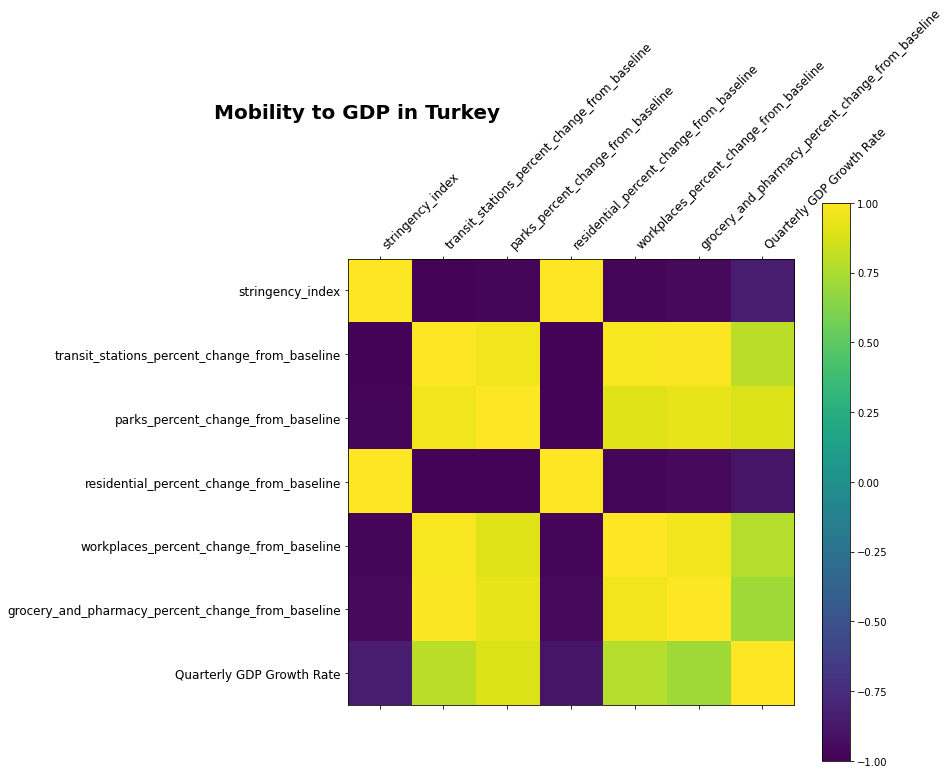

In [ ]:
heat_map(corrMatrix_TR_GDP, 'Mobility to GDP in Turkey')

### 3. Mobility to GDP in Japan

In [ ]:
country_mobility_scatter(jp_transit_convert, jp_park_convert, jp_residential_convert, jp_workplace_convert, jp_grocery_convert,'Japan')

In [ ]:
combine_jp_mobility_gdp = combine_mobility_with_GDP(jp_stringency_convert,jp_transit_convert,jp_park_convert,jp_residential_convert,jp_workplace_convert,jp_grocery_convert,jp_GDP);
corrMatrix_JP_GDP = combine_jp_mobility_gdp.corr()
corrMatrix_JP_GDP.compute()

,stringency_index,transit_stations_percent_change_from_baseline,parks_percent_change_from_baseline,residential_percent_change_from_baseline,workplaces_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,Quarterly GDP Growth Rate
stringency_index,1.000000,-0.294161,-0.768314,0.272136,-0.367624,0.235336,-0.179369
transit_stations_percent_change_from_baseline,-0.294161,1.000000,0.490539,-0.974447,0.924055,0.534635,0.695671
parks_percent_change_from_baseline,-0.768314,0.490539,1.000000,-0.384019,0.490904,0.312015,0.155644
residential_percent_change_from_baseline,0.272136,-0.974447,-0.384019,1.000000,-0.940619,-0.390237,-0.720047
workplaces_percent_change_from_baseline,-0.367624,0.924055,0.490904,-0.940619,1.000000,0.409604,0.461258
grocery_and_pharmacy_percent_change_from_baseline,0.235336,0.534635,0.312015,-0.390237,0.409604,1.000000,0.172966
Quarterly GDP Growth Rate,-0.179369,0.695671,0.155644,-0.720047,0.461258,0.172966,1.000000


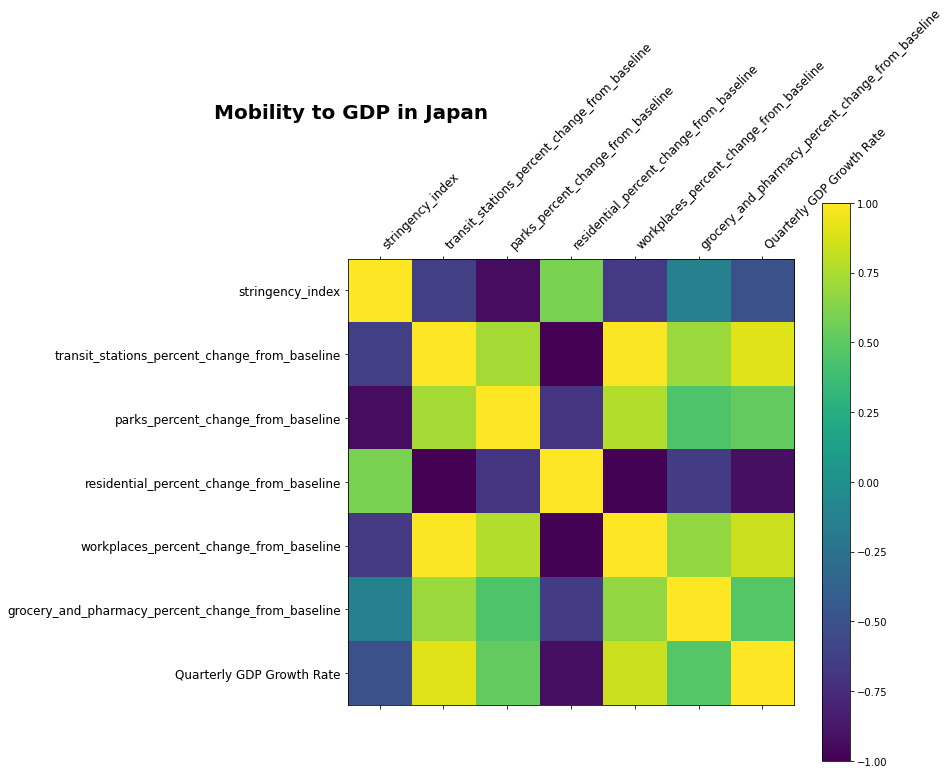

In [ ]:
heat_map(corrMatrix_JP_GDP, 'Mobility to GDP in Japan')